<a href="https://colab.research.google.com/github/hemxnth19/MachineLearning/blob/main/Lab4_Assignment_21210.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [37]:
import numpy as np
import pandas as pd
import math
from collections import Counter

# **A1 : For the data table provided below, calculate the entropy associated with each attribute / feature at the root node. Using this information, identify the first feature that you’d select for constructing the decision tree. Use Information Gain as the impurity measure to identify the root node.‘buys_computer’ is the class label.**

In [38]:
# Creating dataframe

dataset = {'age' : ['<=30','<=30','31...40','>40','>40','>40','31...40','<=30','<=30','>40','<=30','31...40','31...40','>40'],
          'income' : ['high','high','high','medium','low','low','low','medium','low','medium','medium','medium','high','medium'],
          'student' : ['no','no','no','no','yes','yes','yes','no','yes','yes','yes','no','yes','no'],
          'credit_rating' : ['fair','excellent','fair','fair','fair','excellent','excellent','fair','fair','fair','excellent','excellent','fair','excellent'],
          'buys_computer' : ['no','no','yes','yes','yes','no','yes','no','yes','yes','yes','yes','yes','no']}

df = pd.DataFrame(dataset)
df

,age,income,student,credit_rating,buys_computer
0,<=30,high,no,fair,no
1,<=30,high,no,excellent,no
2,31...40,high,no,fair,yes
3,>40,medium,no,fair,yes
4,>40,low,yes,fair,yes
5,>40,low,yes,excellent,no
6,31...40,low,yes,excellent,yes
7,<=30,medium,no,fair,no
8,<=30,low,yes,fair,yes
9,>40,medium,yes,fair,yes


In [39]:
# Calculate entropy

def entropy(data):
    n = len(data)
    label_counts = Counter(data)
    entropy = 0
    for label in label_counts:
        prob = label_counts[label] / n
        entropy -= prob * math.log2(prob)
    return entropy


# Calculate entropy of target [buys_computer]

target_entropy = entropy(df['buys_computer'])
print(f'Entropy : {target_entropy}')

# Define a function to calculate conditional entropy
def conditional_entropy(feature, target):
    feature_value_counts = Counter(feature)
    conditional_entropy = 0
    for value, count in feature_value_counts.items():
        prob = count / len(feature)
        subset_target = [target[i] for i in range(len(target)) if feature[i] == value]
        conditional_entropy += prob * entropy(subset_target)
    return conditional_entropy


# Calculate information gain for each feature

age_gain = target_entropy - conditional_entropy(df['age'], df['buys_computer'])
income_gain = target_entropy - conditional_entropy(df['income'], df['buys_computer'])
student_gain = target_entropy - conditional_entropy(df['student'], df['buys_computer'])
credit_rating_gain = target_entropy - conditional_entropy(df['credit_rating'], df['buys_computer'])


print(f'Age - Information Gain: {age_gain}')
print(f'Income - Information Gain: {income_gain}')
print(f'Student - Information Gain: {student_gain}')
print(f'Credit - Rating Information Gain: {credit_rating_gain}')

Entropy : 0.9402859586706311
Age - Information Gain: 0.24674981977443933
Income - Information Gain: 0.02922256565895487
Student - Information Gain: 0.15183550136234159
Credit - Rating Information Gain: 0.04812703040826949


# **A2 :  Create a Decision Tree for the above data. Get the depth of the constructed tree.**

In [40]:
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt

In [41]:
# Encode categorical variables to numerical values

le = LabelEncoder()
for column in df.columns:
  df[column] = le.fit_transform(df[column])
df

,age,income,student,credit_rating,buys_computer
0,1,0,0,1,0
1,1,0,0,0,0
2,0,0,0,1,1
3,2,2,0,1,1
4,2,1,1,1,1
5,2,1,1,0,0
6,0,1,1,0,1
7,1,2,0,1,0
8,1,1,1,1,1
9,2,2,1,1,1


In [42]:
def Decision_Tree_Model(data):

    # Define features and target
    X=data.iloc[:,:-1].values
    y=data.iloc[:,-1].values

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    # Create a decision tree classifier
    dtc = DecisionTreeClassifier()  # Criterion : Default

    # Fit the classifier to the training data
    dtc.fit(X_train, y_train)

    # Visualize the constructed tree with plot_tree() command
    plt.figure(figsize=(90,40))
    plot_tree(dtc, filled=True)
    plt.show()

    # Print the tree depth
    print(f"Tree Depth :{dtc.get_depth()}")


    # Accuracy on the train data
    accuracy = dtc.score(X_train, y_train)
    percentage =  accuracy * 100
    print( f"Accuracy on the train data : {percentage} % ")


    # Accuracy on the test data
    accuracy = dtc.score(X_test, y_test)
    percentage =  accuracy * 100
    print( f"Accuracy on the test data : {percentage} % ")


# **A3. Visualize the constructed tree with plot_tree() command. Following code snippet for help.**

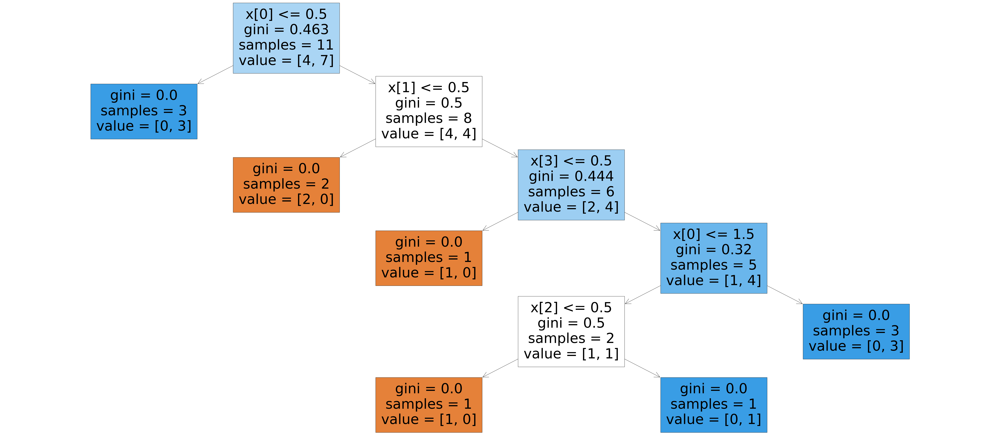

Tree Depth :5
Accuracy on the train data : 100.0 % 
Accuracy on the test data : 66.66666666666666 % 


In [58]:
Decision_Tree_Model(df)

# **A4 : Create a Decision Tree classifier on your project data. Study the accuracy for training and test data and infer the accuracy of tree construction. Plot the Decision Tree obtained above. Below code for help.**

In [44]:
df1 = pd.read_excel("/content/drive/MyDrive/Machine Learning /EndSem_Project/Sentiment_analysis_embedding_data.xlsx")
df1

,embed_0,embed_1,embed_2,embed_3,embed_4,embed_5,embed_6,embed_7,embed_8,embed_9,...,embed_758,embed_759,embed_760,embed_761,embed_762,embed_763,embed_764,embed_765,embed_766,embed_767
0,0.009625,-0.029216,0.027109,0.023631,-0.004972,0.031757,-0.045125,0.044483,0.019400,-0.017189,...,-0.045697,-0.001972,-0.008154,-0.056139,0.009890,0.042366,0.040134,0.009304,-0.016137,-0.009309
1,-0.007535,-0.039844,0.030167,0.031224,0.004742,0.028289,-0.068723,0.039153,0.019596,-0.027138,...,-0.056834,0.008613,-0.006578,-0.034220,0.027574,0.045456,0.027402,0.017837,-0.035009,-0.010062
2,0.022408,-0.030840,0.032328,0.046965,0.007798,0.025860,-0.065093,0.035118,0.035359,-0.029205,...,-0.016249,0.020413,-0.034288,-0.050649,0.028408,0.040412,0.030261,0.003535,-0.034122,-0.017289
3,0.019677,-0.034055,0.012662,0.070387,-0.011170,0.017842,-0.050945,0.044878,0.034781,-0.025772,...,-0.038879,0.002963,-0.018754,-0.053278,0.033005,0.031635,0.022544,-0.011774,-0.011125,-0.017540
4,0.017678,-0.030323,0.012829,0.065267,-0.025161,0.011964,-0.050590,0.042820,0.029161,-0.015004,...,-0.042079,0.010192,-0.010147,-0.035857,0.021784,0.034621,0.017342,-0.009884,-0.010316,-0.029238
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,0.019743,-0.071799,0.022546,0.049042,-0.005767,-0.016275,-0.037731,0.029718,0.009203,-0.030913,...,-0.040456,-0.001192,-0.026138,-0.056447,0.015818,0.045241,0.012620,-0.004837,-0.014540,-0.046791
896,0.000186,-0.027604,0.010623,0.038237,-0.026675,0.020215,-0.040816,0.032210,0.041016,-0.014836,...,-0.026985,0.015479,-0.003967,-0.037808,0.021234,0.031012,-0.010890,0.003081,-0.015145,-0.045444
897,0.018066,-0.032152,0.039794,0.047608,0.003898,0.024092,-0.056508,0.020527,0.031972,-0.026038,...,-0.041547,0.011308,-0.016882,-0.059904,0.009558,0.039976,0.029574,0.013737,-0.003724,-0.017324
898,-0.003492,-0.022739,0.021777,0.044054,-0.005621,0.013863,-0.079196,0.039150,0.004557,-0.015787,...,-0.057920,0.004005,-0.007196,-0.041652,0.020945,0.047604,0.019767,0.005806,-0.019280,-0.016415


In [45]:
df2 = pd.read_excel("/content/drive/MyDrive/Machine Learning /EndSem_Project/Sentiment_analysis_of_legal_texts.xlsx")
df2

,Id,Judgment,Lawyers Summary,Golden summary,Domain,Judgment Status,Equivalent Citation,Name,Court name,Label,Link
0,1,"""1. Being aggrieved by the judgment delivered ...","""The appeal was filed by a co-operative socie...","""The appellant, a cooperative society, filed a...",Civil,Appeal dismissed,CIVIL APPEAL NO. 3880 OF 2003,Rajasthan R.S.S. & Ginning Mills Fed.Ltd Vs. D...,Supreme Court,0,NaN
1,2,"""This was an appeal from a judgment and decree...","A complaint has been lodged against you, unde...","""The appellants were members of the East India...",Civil,Appeal dismissed,"1950 AIR, 7 1950 SCR 64",Messrs. Khimji Poonja And Company vs Shri Bald...,Supreme Court,0,NaN
2,3,"""This was an application under article 32 (1) ...",Appeal comes under article 374 (4) of the Con...,"""Petitioner Rashid Ahmed is running a wholesal...",Civil,Petition allowed,"1950 AIR 163, 1950 SCR 566","Rashid Ahmed vs The Municipal Board, Kairana.T...",Supreme Court,0,NaN
3,4,"""APPEAL from a judgment of the High Court of H...",The appeal was presented to the Judicial Commi...,"""The decree-holder made an application in revi...",Civil,Appeal allowed,"1953 AIR 413, 1950 SCR 747",Supreme Court Of India ... vs Kadar Unnisa Beg...,Supreme Court,0,NaN
4,5,"""APPEAL under article 374(4) of the Constituti...",The appeal was presented to the Judicial Commi...,"""An application was made for the execution of...",Civil,Appeal allowed,"1950 AIR 274, 1950 SCR 741",Supreme Court Of India ... vs Nandlal on 12 O...,Supreme Court,0,NaN
...,...,...,...,...,...,...,...,...,...,...,...
895,896,documents in column 3 thereof. The petitioner ...,,,Writ,NaN,NaN,NaN,Calcutta High Court,2,NaN
896,897,for such unauthorised construction before the ...,,,Civil,NaN,NaN,NaN,Calcutta High Court,0,NaN
897,898,"Mr. Jayanta Kr. Mitra, Sr. Advocate with Mr. R...",,,Writ,NaN,NaN,NaN,Calcutta High Court,2,NaN
898,899,Considering the averments contained in the app...,,,Revision Petition,NaN,NaN,NaN,Calcutta High Court,5,NaN


In [46]:
df1['Score'] = df2['Label']
df1

,embed_0,embed_1,embed_2,embed_3,embed_4,embed_5,embed_6,embed_7,embed_8,embed_9,...,embed_759,embed_760,embed_761,embed_762,embed_763,embed_764,embed_765,embed_766,embed_767,Score
0,0.009625,-0.029216,0.027109,0.023631,-0.004972,0.031757,-0.045125,0.044483,0.019400,-0.017189,...,-0.001972,-0.008154,-0.056139,0.009890,0.042366,0.040134,0.009304,-0.016137,-0.009309,0
1,-0.007535,-0.039844,0.030167,0.031224,0.004742,0.028289,-0.068723,0.039153,0.019596,-0.027138,...,0.008613,-0.006578,-0.034220,0.027574,0.045456,0.027402,0.017837,-0.035009,-0.010062,0
2,0.022408,-0.030840,0.032328,0.046965,0.007798,0.025860,-0.065093,0.035118,0.035359,-0.029205,...,0.020413,-0.034288,-0.050649,0.028408,0.040412,0.030261,0.003535,-0.034122,-0.017289,0
3,0.019677,-0.034055,0.012662,0.070387,-0.011170,0.017842,-0.050945,0.044878,0.034781,-0.025772,...,0.002963,-0.018754,-0.053278,0.033005,0.031635,0.022544,-0.011774,-0.011125,-0.017540,0
4,0.017678,-0.030323,0.012829,0.065267,-0.025161,0.011964,-0.050590,0.042820,0.029161,-0.015004,...,0.010192,-0.010147,-0.035857,0.021784,0.034621,0.017342,-0.009884,-0.010316,-0.029238,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
895,0.019743,-0.071799,0.022546,0.049042,-0.005767,-0.016275,-0.037731,0.029718,0.009203,-0.030913,...,-0.001192,-0.026138,-0.056447,0.015818,0.045241,0.012620,-0.004837,-0.014540,-0.046791,2
896,0.000186,-0.027604,0.010623,0.038237,-0.026675,0.020215,-0.040816,0.032210,0.041016,-0.014836,...,0.015479,-0.003967,-0.037808,0.021234,0.031012,-0.010890,0.003081,-0.015145,-0.045444,0
897,0.018066,-0.032152,0.039794,0.047608,0.003898,0.024092,-0.056508,0.020527,0.031972,-0.026038,...,0.011308,-0.016882,-0.059904,0.009558,0.039976,0.029574,0.013737,-0.003724,-0.017324,2
898,-0.003492,-0.022739,0.021777,0.044054,-0.005621,0.013863,-0.079196,0.039150,0.004557,-0.015787,...,0.004005,-0.007196,-0.041652,0.020945,0.047604,0.019767,0.005806,-0.019280,-0.016415,5


In [47]:
# Threshold to segregate into 2 classes (range[0,1] as 0 and range[2,10] as 1)
threshold = 5

# Replace values in 'Score' with the threshold
df1['Score'] = np.where(df1['Score'] >= threshold, 1, 0)

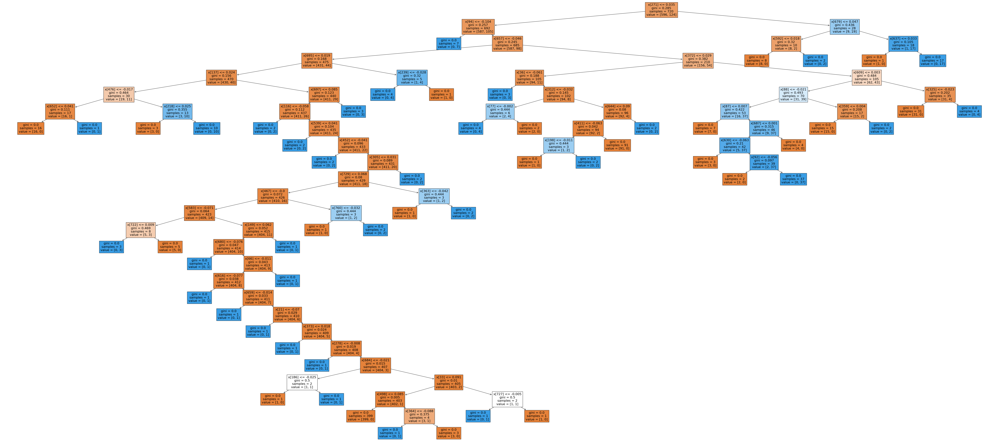

Tree Depth :25
Accuracy on the train data : 100.0 % 
Accuracy on the test data : 72.77777777777777 % 


In [48]:
Decision_Tree_Model(df1)

# **A5 : Impose a max_depth constraint on the tree construction.Construct the tree again and check the accuracies. Visualize the tree constructed with max_depth constraint.**

In [49]:
def Decision_Tree_Model_MaxDepth(data):

    # Define features and target
    X=data.iloc[:,:-1].values
    y=data.iloc[:,-1].values

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    # Create a decision tree classifier
    dtc = DecisionTreeClassifier(max_depth=5)  # max_depth=5

    # Fit the classifier to the training data
    dtc.fit(X_train, y_train)

    # Visualize the constructed tree with plot_tree() command
    plt.figure(figsize=(90,40))
    plot_tree(dtc, filled=True)
    plt.show()

    # Print the tree depth
    print(f"Tree Depth :{dtc.get_depth()}")

    # Accuracy on the train data
    accuracy = dtc.score(X_train, y_train)
    percentage =  accuracy * 100
    print( f"Accuracy on the train data : {percentage} % ")


    # Accuracy on the test data
    accuracy = dtc.score(X_test, y_test)
    percentage =  accuracy * 100
    print( f"Accuracy on the test data : {percentage} % ")

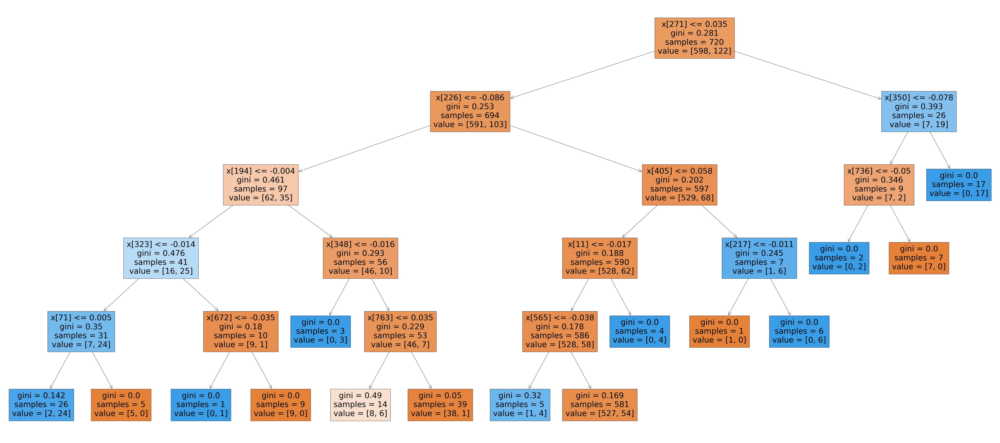

Tree Depth :5
Accuracy on the train data : 91.11111111111111 % 
Accuracy on the test data : 77.22222222222223 % 


In [50]:
Decision_Tree_Model_MaxDepth(df1)

# **A6 : Study the criterion of the DT in the above model. Change the criterion to “Entropy” and study the model & graph. Find the differences between the default criterion and entropy criterion. Refer code below for criterion.**

In [51]:
def Decision_Tree_Model_entropy(data):

    # Define features and target
    X=data.iloc[:,:-1].values
    y=data.iloc[:,-1].values

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    # Create a decision tree classifier
    dtc = DecisionTreeClassifier(criterion="entropy")  # criterion : entropy

    # Fit the classifier to the training data
    dtc.fit(X_train, y_train)

    # Visualize the constructed tree with plot_tree() command
    plt.figure(figsize=(100,40))
    plot_tree(dtc, filled=True)
    plt.show()

    # Print the tree depth
    print(f"Tree Depth :{dtc.get_depth()}")

    # Prediction
    y_pred = dtc.predict(X_test)

    # Accuracy on the train data
    accuracy = dtc.score(X_train, y_train)
    percentage =  accuracy * 100
    print( f"Accuracy on the train data : {percentage} % ")


    # Accuracy on the test data
    accuracy = dtc.score(X_test, y_test)
    percentage =  accuracy * 100
    print( f"Accuracy on the test data : {percentage} % ")

    # Confusion Matrix
    CM = confusion_matrix(y_test,y_pred)
    print( f"Confusion Matrix : \n{CM}")

    # Classification Report
    CR = classification_report(y_test,y_pred)
    print( f"Accuracy on the train data : \n{CR}")

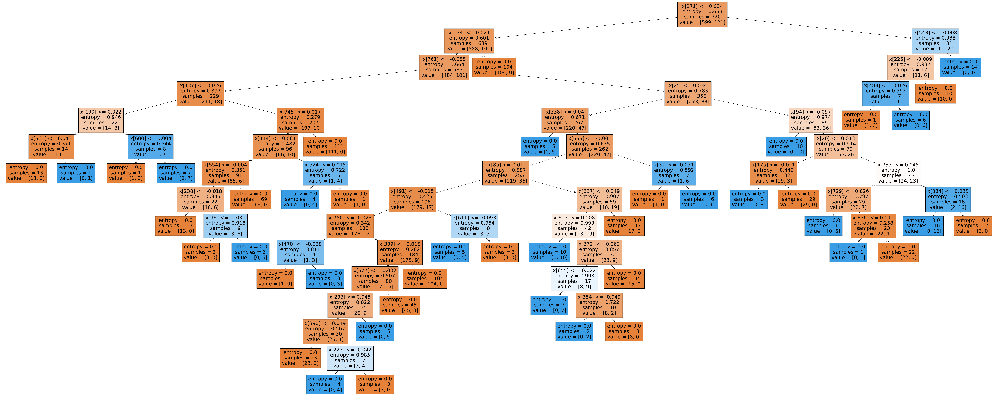

Tree Depth :14
Accuracy on the train data : 100.0 % 
Accuracy on the test data : 82.22222222222221 % 
Confusion Matrix : 
[[133  14]
 [ 18  15]]
Accuracy on the train data : 
              precision    recall  f1-score   support

           0       0.88      0.90      0.89       147
           1       0.52      0.45      0.48        33

    accuracy                           0.82       180
   macro avg       0.70      0.68      0.69       180
weighted avg       0.81      0.82      0.82       180



In [52]:
Decision_Tree_Model_entropy(df1)

# **A7. Construct a random forest classifier on your project data. Find the differences between the decision tree & random forest classifiers with the help of the performance metrics.**

In [53]:
from sklearn.ensemble import RandomForestClassifier

In [54]:
def Random_Forest_Model(data):

    # Define features and target
    X=data.iloc[:,:-1].values
    y=data.iloc[:,-1].values

    # Split the dataset into training and testing sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

    # Create a random forest classifier
    rfc = RandomForestClassifier()

    # Fit the classifier to the training data
    rfc.fit(X_train, y_train)

    # Visualize
    visualize = 5
    estimator = rfc.estimators_[visualize]

    # Plot the tree
    plt.figure(figsize=(100,40))
    plot_tree(estimator, filled=True)
    plt.show()


    # Prediction
    y_pred = rfc.predict(X_test)

    # Accuracy on the train data
    accuracy = rfc.score(X_train, y_train)
    percentage =  accuracy * 100
    print( f"Accuracy on the train data : {percentage} % ")


    # Accuracy on the test data
    accuracy = rfc.score(X_test, y_test)
    percentage =  accuracy * 100
    print( f"Accuracy on the test data : {percentage} % ")

    # Confusion Matrix
    CM = confusion_matrix(y_test,y_pred)
    print( f"Confusion Matrix : \n{CM}")

    # Classification Report
    CR = classification_report(y_test,y_pred)
    print( f"Accuracy on the train data : \n{CR}")

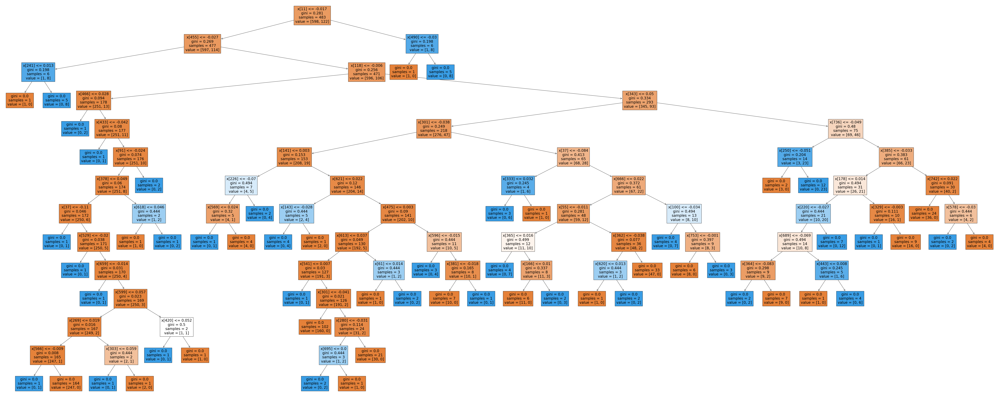

Accuracy on the train data : 99.86111111111111 % 
Accuracy on the test data : 85.0 % 
Confusion Matrix : 
[[151   0]
 [ 27   2]]
Accuracy on the train data : 
              precision    recall  f1-score   support

           0       0.85      1.00      0.92       151
           1       1.00      0.07      0.13        29

    accuracy                           0.85       180
   macro avg       0.92      0.53      0.52       180
weighted avg       0.87      0.85      0.79       180



In [55]:
# Random Forest
Random_Forest_Model(df1)

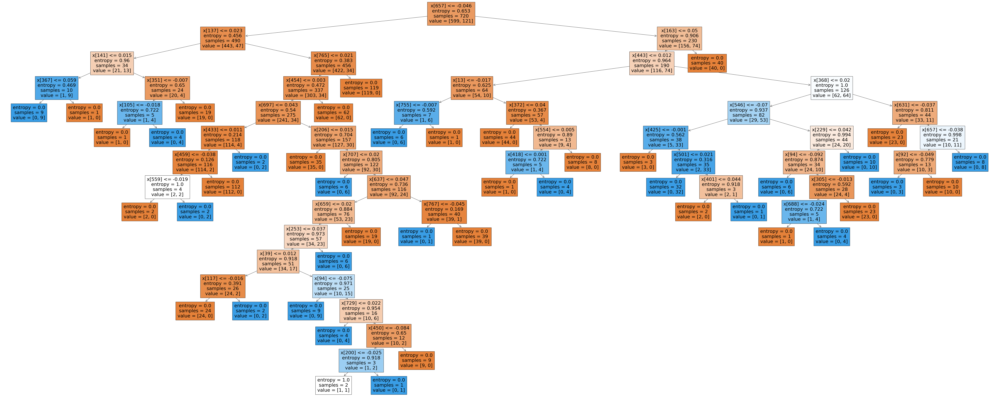

Tree Depth :15
Accuracy on the train data : 99.86111111111111 % 
Accuracy on the test data : 75.0 % 
Confusion Matrix : 
[[131  16]
 [ 29   4]]
Accuracy on the train data : 
              precision    recall  f1-score   support

           0       0.82      0.89      0.85       147
           1       0.20      0.12      0.15        33

    accuracy                           0.75       180
   macro avg       0.51      0.51      0.50       180
weighted avg       0.71      0.75      0.72       180



In [59]:
# Decision Tree
Decision_Tree_Model_entropy(df1)

# **A8. Study thevarious parameters and model attributes of random forest classifier. Understand their significance in the behavior of the model.**

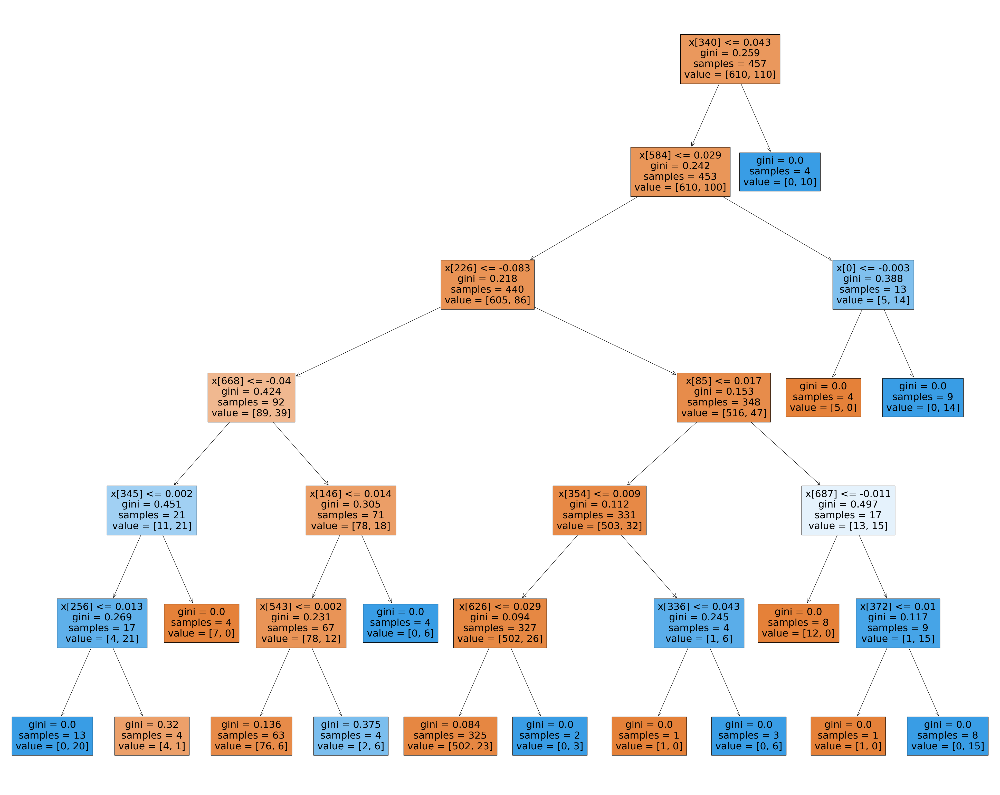

Accuracy on the train data : 90.83333333333333 % 
Accuracy on the test data : 84.44444444444444 % 


In [57]:
# Define features and target
X=df1.iloc[:,:-1].values
y=df1.iloc[:,-1].values

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# Create a random forest classifier
rfc = RandomForestClassifier(
n_estimators=100,       # Number of decision trees in the forest
max_depth=6,            # Maximum depth of individual trees
min_samples_split=2,    # Minimum number of samples required to split an internal node
min_samples_leaf=1,     # Minimum number of samples required to be at a leaf node
max_features=0.5,       # max_features = 0.5 means it considers a random 50% of the total features at each split.
random_state=42         # Seed for random number generator for reproducibility
)

# Fit the classifier to the training data
rfc.fit(X_train, y_train)


# Prediction
y_pred = rfc.predict(X_test)

# Visualize
visualize = 5
estimator = rfc.estimators_[visualize]

# Plot the tree
plt.figure(figsize=(50,40))
plot_tree(estimator, filled=True)
plt.show()

# Accuracy on the train data
accuracy = rfc.score(X_train, y_train)
percentage =  accuracy * 100
print( f"Accuracy on the train data : {percentage} % ")


# Accuracy on the test data
accuracy = rfc.score(X_test, y_test)
percentage =  accuracy * 100
print( f"Accuracy on the test data : {percentage} % ")